In [ ]:
# import the libraries as shown below

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from glob import glob
from tensorflow.keras.callbacks import Callback

In [ ]:
# re-size all the images to this
IMAGE_SIZE = [200, 200]

train_path = '/content/drive/MyDrive/data-set/tranning'
valid_path = '/content/drive/MyDrive/data-set/validation'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import the Vgg 16 library as shown below and add preprocessing layer to the front of VGG
# Here we will be using imagenet weights

vgg = VGG16(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
# don't train existing weights layer.trainable must be False
for layer in vgg.layers:
    layer.trainable = False

In [ ]:
folders=glob('/content/drive/MyDrive/data-set/tranning/*')

In [ ]:
len(folders)

15

In [ ]:
# our layers(flatten the images)
x = Flatten()(vgg.output)
#x=Dense(1024,activation='relu')(x)

In [ ]:
# Activation function must be softmax because there are more than 2 classes
prediction = Dense(len(folders), activation='softmax')(x)# This is output layer

# create a object of the model
model = Model(inputs=vgg.input, outputs=prediction)

In [ ]:
# the cost and optimization of the model
model.compile(
  loss='categorical_crossentropy',
  optimizer='adam',
  metrics=['accuracy']
)

In [ ]:
# Use  Image Data Generator to import the images from the dataset
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Simple Data Augmentation with the help of shear_range,zoom_range,horizontal_flip for Trainning set only
# Data Augmentation is required because we have small dataset
train_datagenrator = ImageDataGenerator(rescale = 1./255)

                                  #  rotation_range=40,
                                  #  height_shift_range=0.2,
                                  #  width_shift_range=0.2,
                                  #  shear_range = 0.2,
                                  #  zoom_range = 0.2,
                                  #  horizontal_flip = True
test_datagenrator = ImageDataGenerator(rescale = 1./255)

In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagenrator.flow_from_directory('/content/drive/MyDrive/data-set/tranning',
                                                 target_size = (200, 200),
                                                 batch_size = 16,
                                                 class_mode = 'categorical')

Found 2036 images belonging to 15 classes.


In [ ]:
test_set = test_datagenrator.flow_from_directory('/content/drive/MyDrive/data-set/validation',
                                            target_size = (200, 200),
                                            batch_size = 16,
                                            class_mode = 'categorical')

Found 2035 images belonging to 15 classes.


In [ ]:
class ownCallback(tf.keras.callbacks.Callback):
  def oneepoch(self,epoch,logs={}):
    if(logs.get('accuracy')>0.95):
      print("Reaches 96% accuracy")
      self.model.stop_training= True

In [ ]:
# fit the model
callbacks=ownCallback()
Predict = model.fit_generator(
  training_set,
  validation_data=test_set,
  epochs=11,
  steps_per_epoch=len(training_set),
  validation_steps=len(test_set),
  callbacks=[callbacks]
)

<ipython-input-20-5baff6e31dbc>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  Predict = model.fit_generator(


Epoch 1/11
128/128 [==============================] - 1840s 14s/step - loss: 1.3707 - accuracy: 0.5722 - val_loss: 0.7728 - val_accuracy: 0.7450
Epoch 2/11
128/128 [==============================] - 1813s 14s/step - loss: 0.3567 - accuracy: 0.8929 - val_loss: 0.8970 - val_accuracy: 0.7243
Epoch 3/11
128/128 [==============================] - 1811s 14s/step - loss: 0.2164 - accuracy: 0.9416 - val_loss: 0.8509 - val_accuracy: 0.7459
Epoch 4/11
128/128 [==============================] - 1810s 14s/step - loss: 0.1278 - accuracy: 0.9671 - val_loss: 0.5273 - val_accuracy: 0.8265
Epoch 5/11
128/128 [==============================] - 1821s 14s/step - loss: 0.0561 - accuracy: 0.9971 - val_loss: 0.5016 - val_accuracy: 0.8398
Epoch 6/11
128/128 [==============================] - 1819s 14s/step - loss: 0.0384 - accuracy: 0.9985 - val_loss: 0.5021 - val_accuracy: 0.8369
Epoch 7/11
128/128 [==============================] - 1818s 14s/step - loss: 0.0251 - accuracy: 0.9990 - val_loss: 0.5230 - val_ac

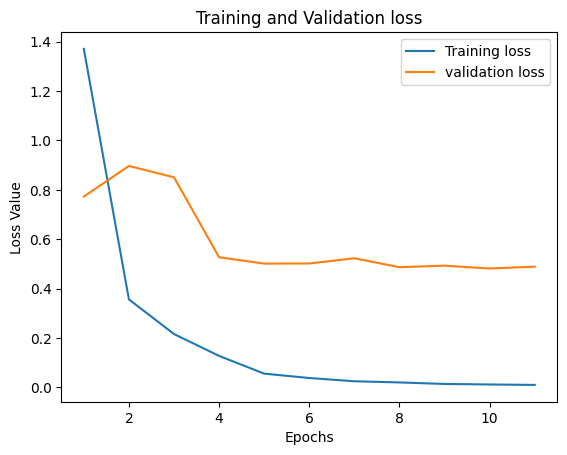

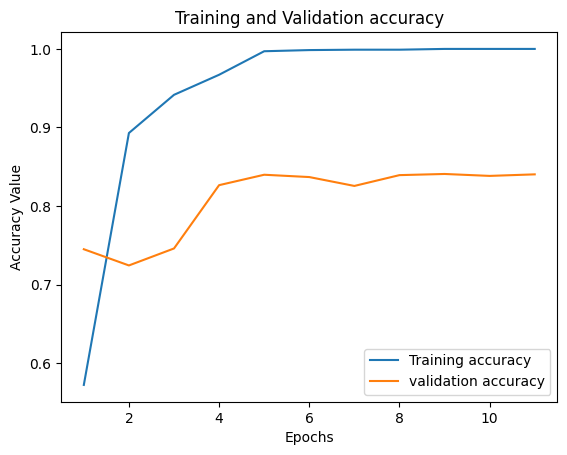

<Figure size 640x480 with 0 Axes>

In [ ]:
# plot the loss
epochs = range(1,12)
plt.plot(epochs,Predict.history['loss'], label='Training loss')
plt.plot(epochs,Predict.history['val_loss'], label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss Value')
plt.legend()
plt.show()
plt.savefig('Loss_Validation')

# plot the accuracy
plt.plot(epochs,Predict.history['accuracy'], label='Training accuracy')
plt.plot(epochs,Predict.history['val_accuracy'], label='validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy Value')
plt.legend()
plt.show()
plt.savefig('Actual_value_Accuracy')

In [ ]:
from tensorflow.keras.models import load_model

model.save('model_VGG16.pkl')

In [ ]:
# save the Tensorflow model as h5 file

# save the Tensorflow model as h5 file

from tensorflow.keras.models import load_model

model.save('model_VGG16.h5')



In [ ]:
model=load_model('/content/drive/MyDrive/model_VGG16.h5')

In [ ]:
import os

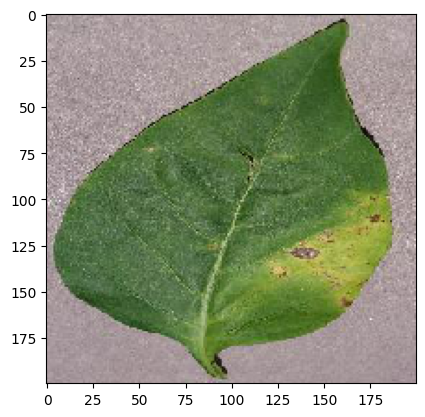

1/1 [==============================] - 0s 404ms/step
[9]


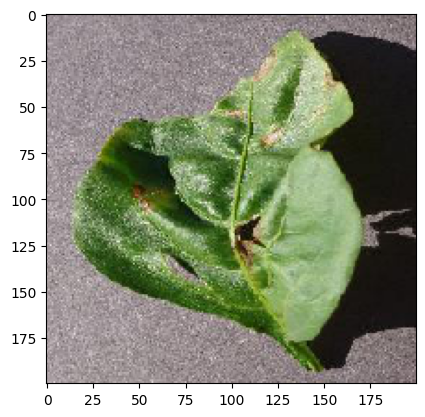

1/1 [==============================] - 0s 392ms/step
[9]


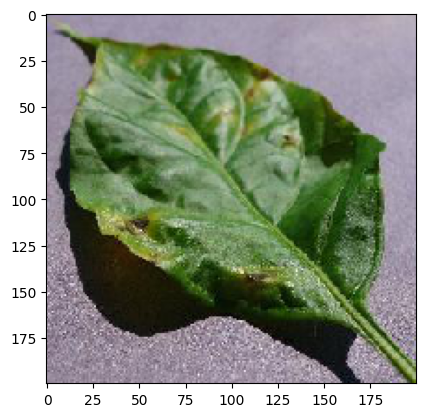

1/1 [==============================] - 0s 448ms/step
[9]


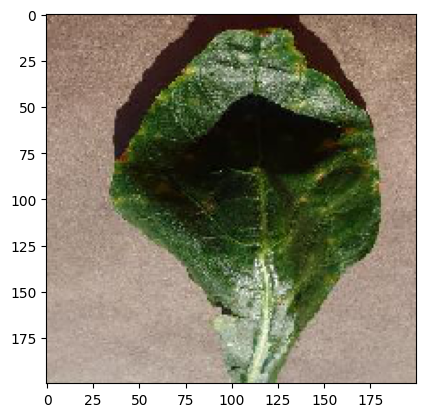

1/1 [==============================] - 0s 404ms/step
[2]


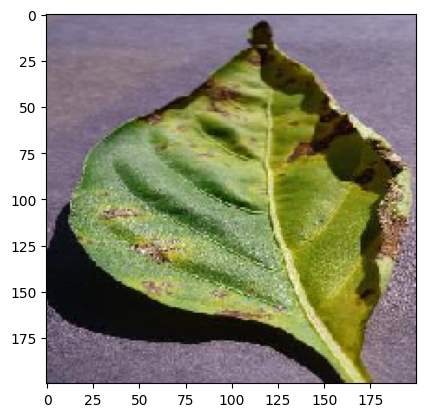

1/1 [==============================] - 0s 404ms/step
[0]
Pepper__bell___Bacterial_spot 196.jpg


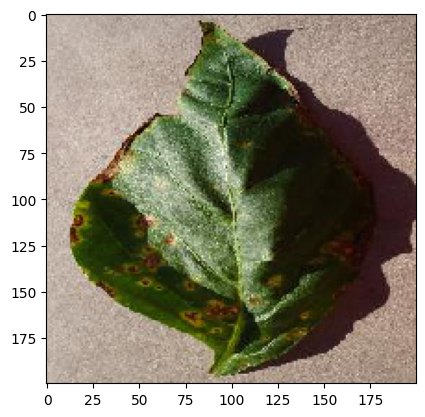

1/1 [==============================] - 0s 390ms/step
[0]
Pepper__bell___Bacterial_spot 185.jpg


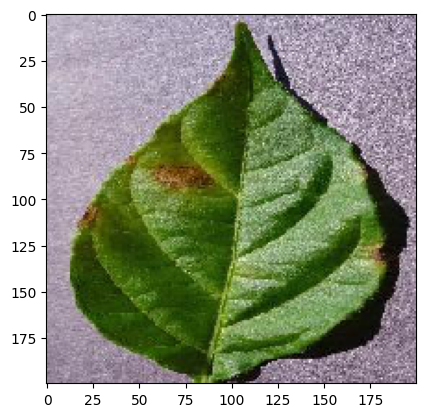

1/1 [==============================] - 1s 739ms/step
[0]
Pepper__bell___Bacterial_spot 187.jpg


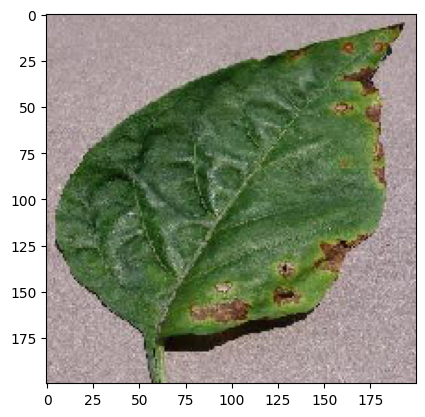

1/1 [==============================] - 1s 726ms/step
[0]
Pepper__bell___Bacterial_spot 194.jpg


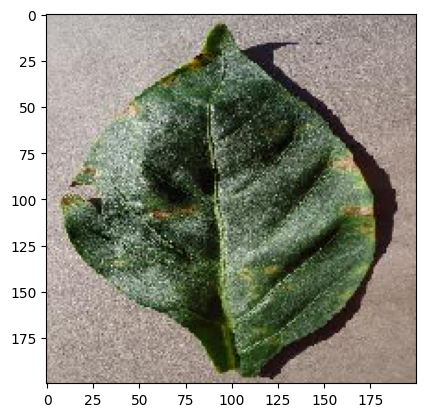

1/1 [==============================] - 1s 679ms/step
[0]
Pepper__bell___Bacterial_spot 201.jpg


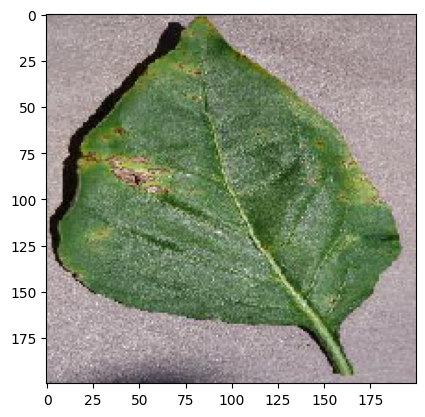

1/1 [==============================] - 1s 752ms/step
[9]


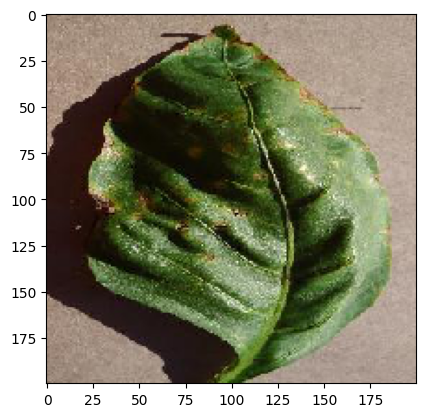

1/1 [==============================] - 0s 451ms/step
[2]


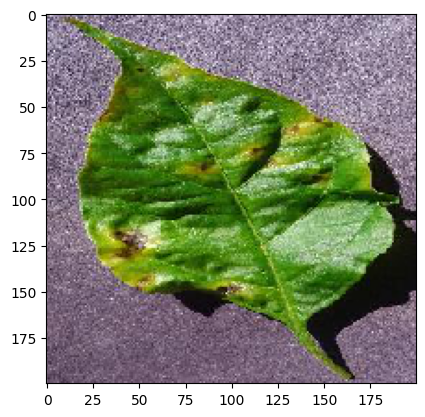

1/1 [==============================] - 0s 422ms/step
[9]


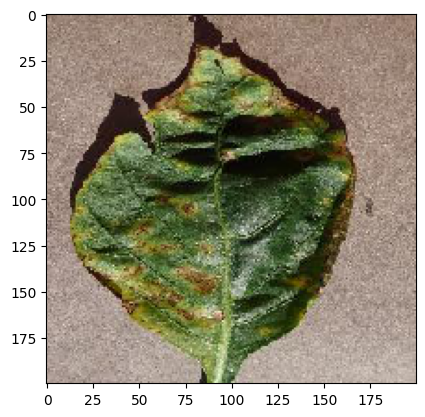

1/1 [==============================] - 0s 415ms/step
[0]
Pepper__bell___Bacterial_spot 210.jpg


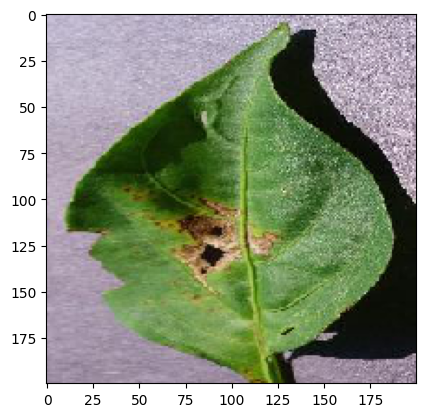

1/1 [==============================] - 0s 403ms/step
[4]


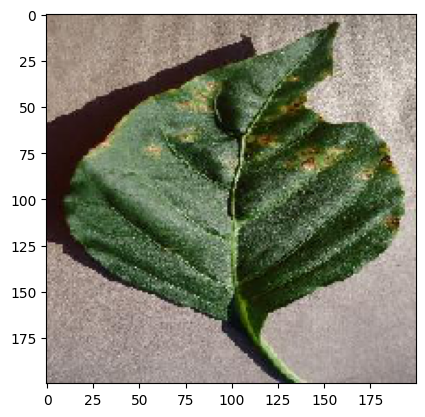

1/1 [==============================] - 0s 414ms/step
[0]
Pepper__bell___Bacterial_spot 211.jpg


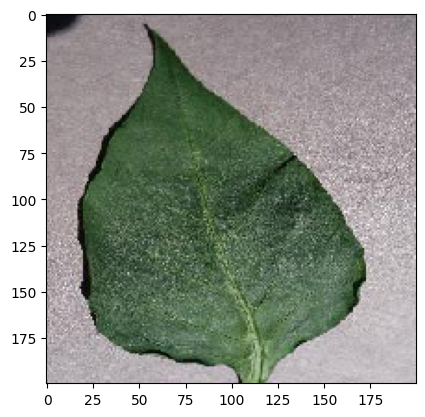

1/1 [==============================] - 0s 421ms/step
[1]
Pepper__bell___healthy 9.jpg


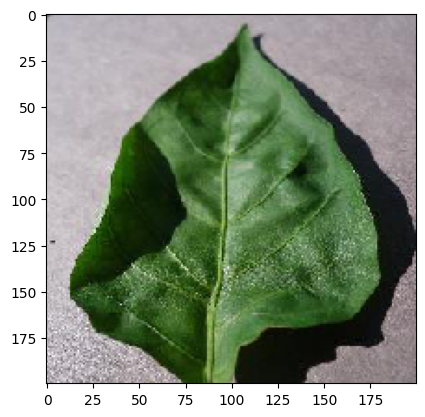

1/1 [==============================] - 0s 416ms/step
[0]
Pepper__bell___Bacterial_spot 100.jpg


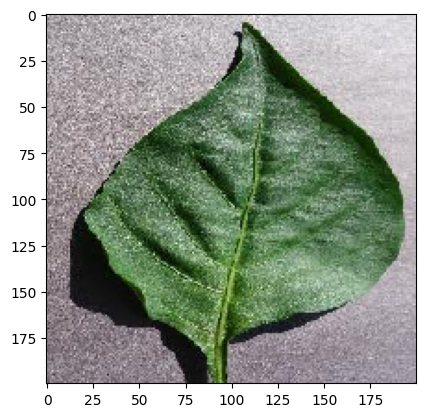

1/1 [==============================] - 0s 424ms/step
[1]
Pepper__bell___healthy 101.jpg


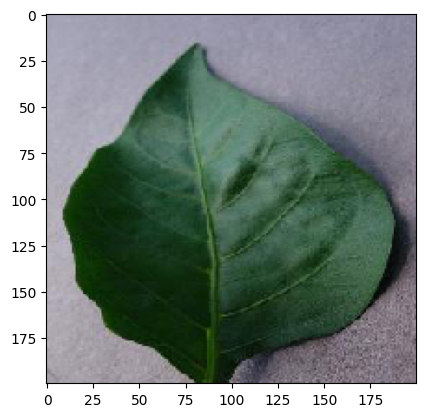

1/1 [==============================] - 0s 428ms/step
[1]
Pepper__bell___healthy 102.jpg


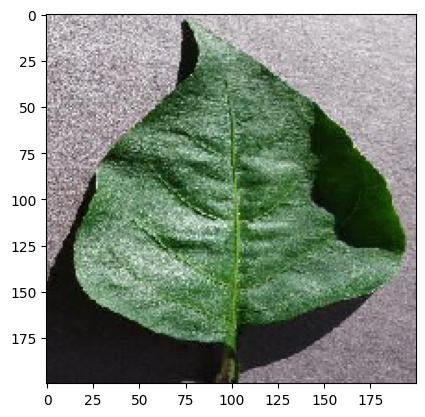

1/1 [==============================] - 0s 457ms/step
[1]
Pepper__bell___healthy 143.jpg


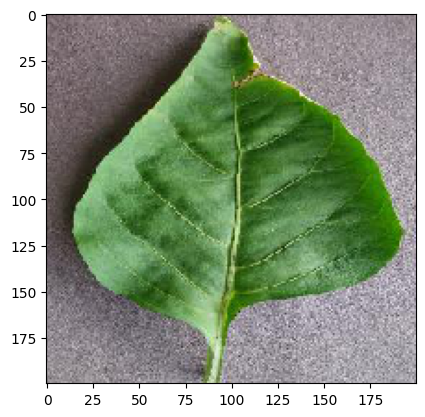

1/1 [==============================] - 0s 426ms/step
[0]
Pepper__bell___Bacterial_spot 136.jpg


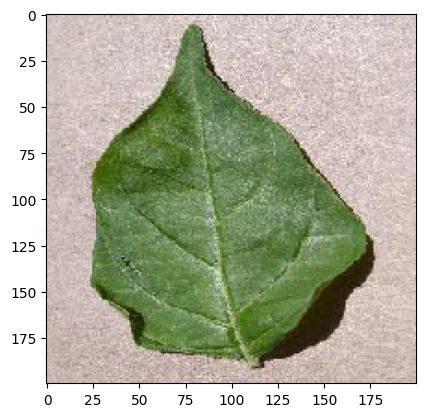

1/1 [==============================] - 1s 509ms/step
[1]
Pepper__bell___healthy 145.jpg


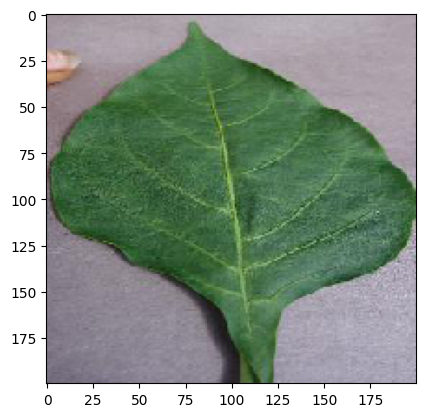

1/1 [==============================] - 1s 771ms/step
[0]
Pepper__bell___Bacterial_spot 139.jpg


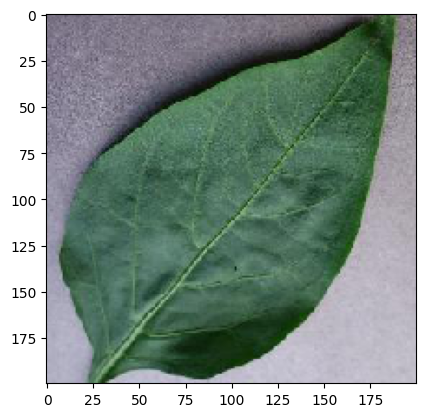

1/1 [==============================] - 1s 762ms/step
[0]
Pepper__bell___Bacterial_spot 147.jpg


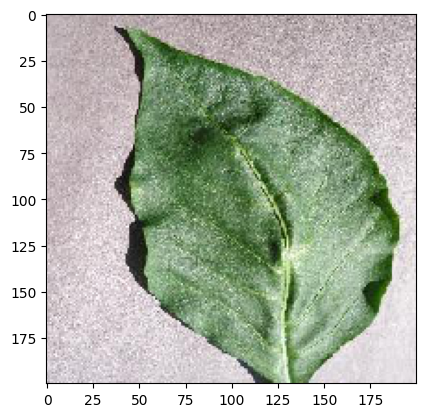

1/1 [==============================] - 1s 777ms/step
[0]
Pepper__bell___Bacterial_spot 146.jpg


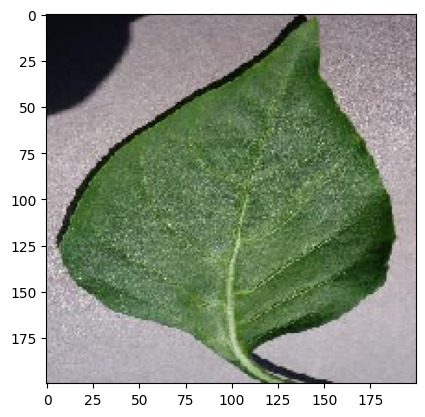

1/1 [==============================] - 1s 782ms/step
[0]
Pepper__bell___Bacterial_spot 140.jpg


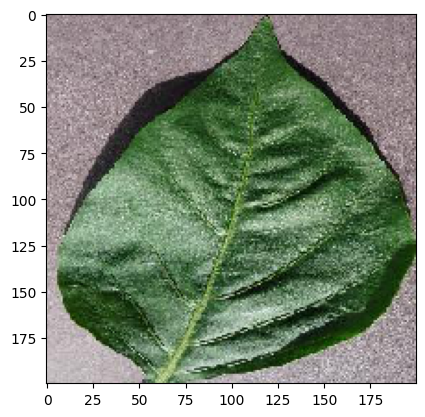

1/1 [==============================] - 1s 638ms/step
[1]
Pepper__bell___healthy 156.jpg


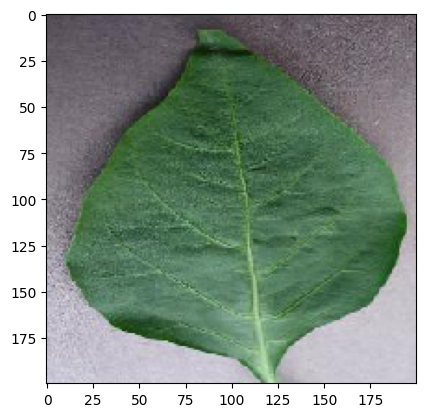

1/1 [==============================] - 1s 534ms/step
[1]
Pepper__bell___healthy 158.jpg


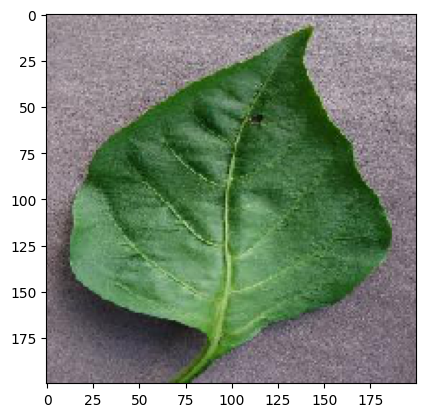

1/1 [==============================] - 0s 434ms/step
[1]
Pepper__bell___healthy 161.jpg


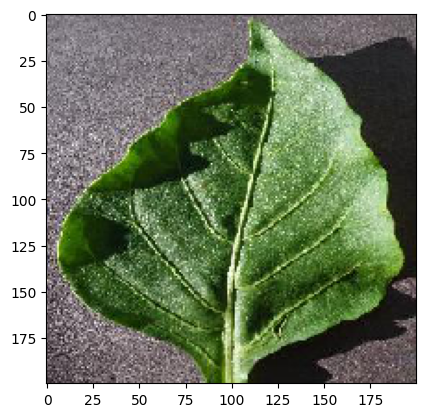

1/1 [==============================] - 0s 481ms/step
[0]
Pepper__bell___Bacterial_spot 149.jpg


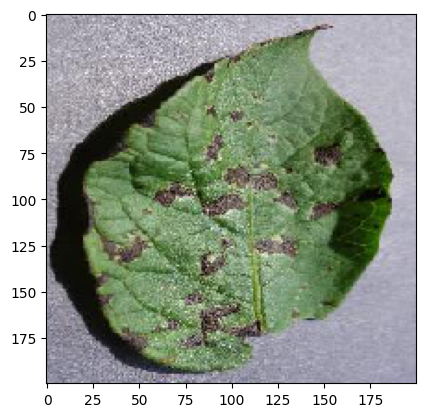

1/1 [==============================] - 0s 466ms/step
[9]


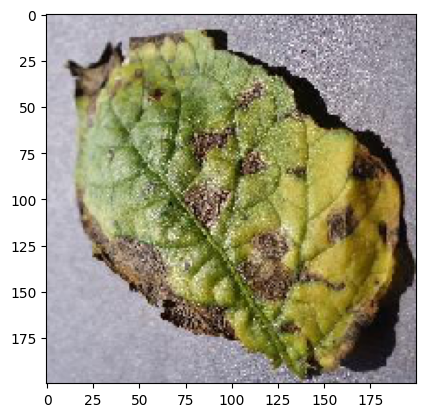

1/1 [==============================] - 0s 473ms/step
[9]


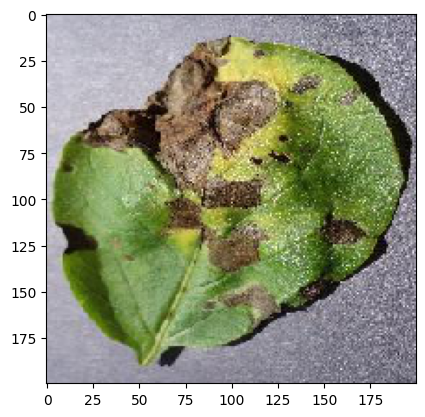

1/1 [==============================] - 0s 488ms/step
[9]


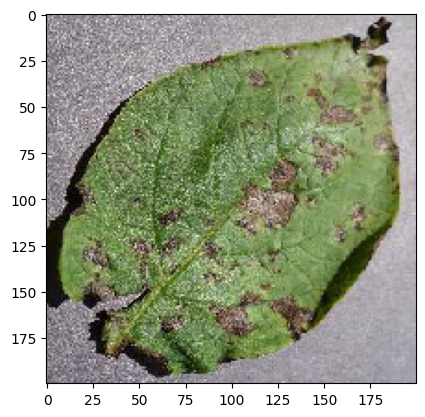

1/1 [==============================] - 0s 476ms/step
[9]


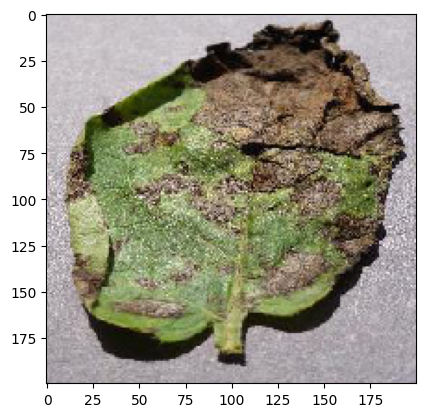

1/1 [==============================] - 1s 535ms/step
[9]


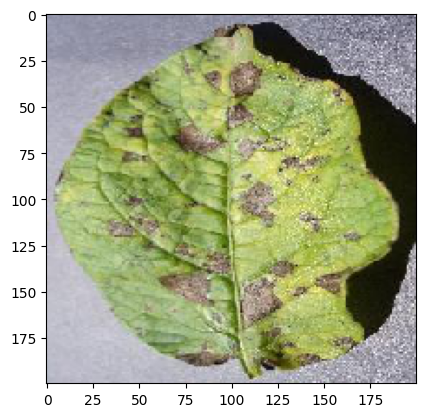

1/1 [==============================] - 1s 526ms/step
[2]


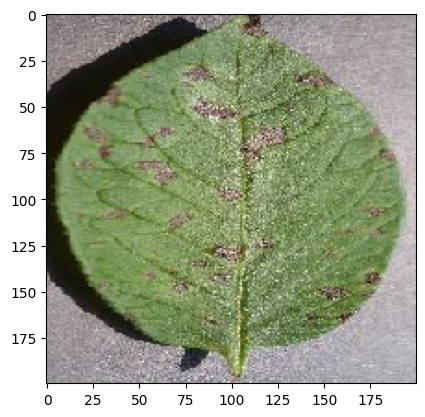

1/1 [==============================] - 1s 804ms/step
[2]


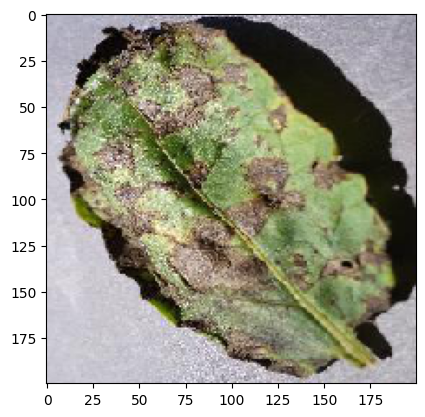

1/1 [==============================] - 1s 769ms/step
[2]


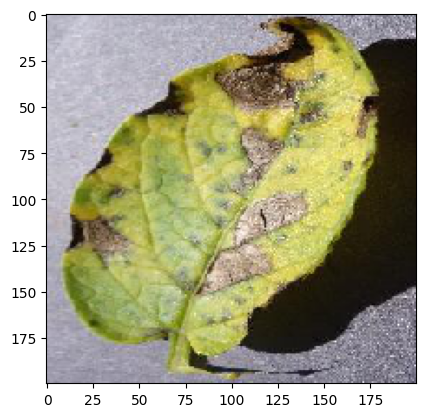

1/1 [==============================] - 1s 766ms/step
[2]


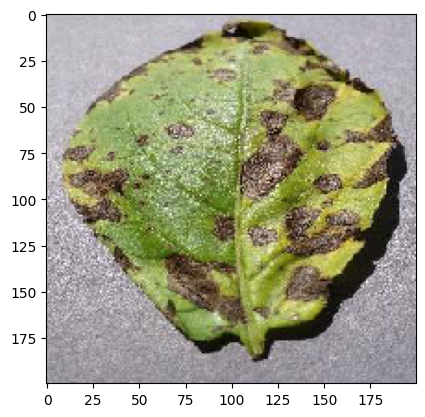

1/1 [==============================] - 1s 749ms/step
[2]


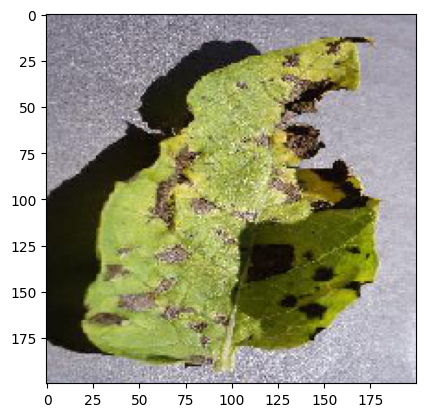

1/1 [==============================] - 1s 792ms/step
[9]


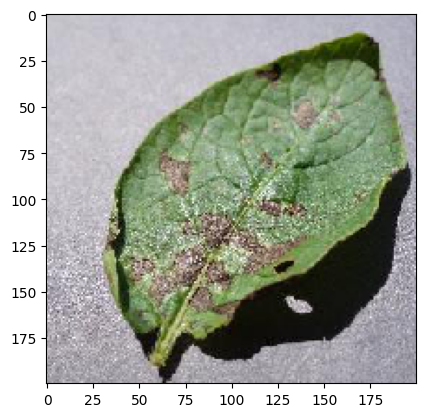

1/1 [==============================] - 1s 734ms/step
[9]


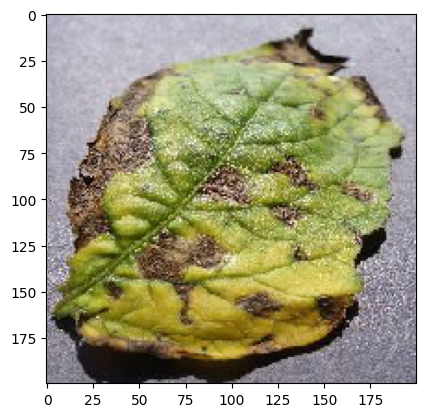

1/1 [==============================] - 1s 571ms/step
[2]


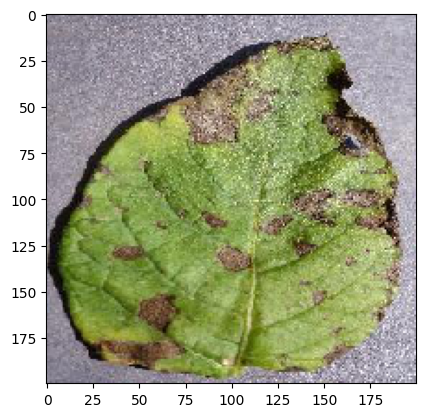

1/1 [==============================] - 1s 578ms/step
[9]


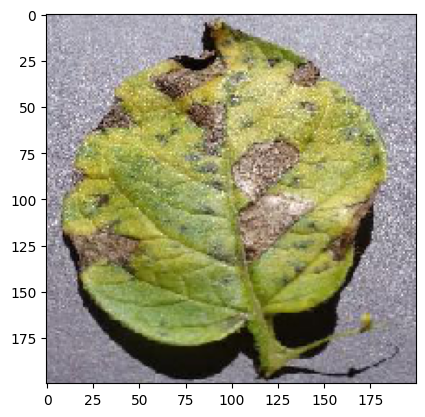

1/1 [==============================] - 1s 578ms/step
[2]


KeyboardInterrupt: ignored

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

dir_path='/content/drive/MyDrive/data-set/testing'

for i in os.listdir(dir_path):
    img=image.load_img(dir_path+'/'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    x=image.img_to_array(img)
    x=np.expand_dims(x,axis=0)
    img_data=preprocess_input(x)
    a=np.argmax(model.predict(img_data), axis=1)
    print(a)
    if(a==0):
      print("Pepper__bell___Bacterial_spot"+" "+i)
    elif(a==1):
      print("Pepper__bell___healthy"+" "+i)


In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

dir_path='/content/drive/MyDrive/data-set/testing'

for i in os.listdir(dir_path):
    img=image.load_img(dir_path+'/'+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    x=image.img_to_array(img)
    x=np.expand_dims(x,axis=0)
    img_data=preprocess_input(x)
    a=np.argmax(model.predict(img_data), axis=1)
    print(a)
    if(a==0):
      print("Pepper__bell___Bacterial_spot"+" "+i)
    elif(a==1):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==2):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==3):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==4):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==5):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==6):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==7):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==8):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==9):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==10):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==11):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==12):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==13):
      print("Pepper__bell___healthy"+" "+i)
    elif(a==14):
      print("Pepper__bell___healthy"+" "+i)

In [ ]:
class_dict = training_set.class_indices
print(class_dict)

{'Pepper__bell___Bacterial_spot': 0, 'Pepper__bell___healthy': 1, 'Potato___Early_blight': 2, 'Potato___Late_blight': 3, 'Potato___healthy': 4, 'Tomato_Bacterial_spot': 5, 'Tomato_Early_blight': 6, 'Tomato_Late_blight': 7, 'Tomato_Leaf_Mold': 8, 'Tomato_Septoria_leaf_spot': 9, 'Tomato_Spider_mites_Two_spotted_spider_mite': 10, 'Tomato__Target_Spot': 11, 'Tomato__Tomato_YellowLeaf__Curl_Virus': 12, 'Tomato__Tomato_mosaic_virus': 13, 'Tomato_healthy': 14}


In [ ]:
# Make sure you provide the same target size as initialied for the image size
training_set = train_datagenrator.flow_from_directory('/content/drive/MyDrive/data-set/tranning',
                                                 target_size = (200, 200),
                                                 batch_size = 16,
                                                 class_mode = 'categorical')

Found 2036 images belonging to 15 classes.


In [ ]:
import cv2
import os
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
model=load_model('/content/drive/MyDrive/model_VGG16.h5')
def preprocess_image(img_path):
    # Load the image using OpenCV
    img = cv2.imread(img_path)
    # Convert to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize to the required size
    img = cv2.resize(img, (200, 200))
    # Convert to float32 and normalize to [0, 1]
    img = img.astype('float32') / 255
    # Add a batch dimension
    img = np.expand_dims(img, axis=0)
    return img
dict1 = {0: 'Pepper__bell___Bacterial_spot', 1: 'Pepper__bell___healthy', 2: 'Potato___Early_blight', 3: 'Potato___Late_blight', 4: 'Potato___healthy', 5: 'Tomato_Bacterial_spot', 6: 'Tomato_Early_blight', 7: 'Tomato_Late_blight', 8: 'Tomato_Leaf_Mold', 9: 'Tomato_Septoria_leaf_spot', 10: 'Tomato_Spider_mites_Two_spotted_spider_mite', 11: 'Tomato__Target_Spot', 12: 'Tomato__Tomato_YellowLeaf__Curl_Virus', 13: 'Tomato__Tomato_mosaic_virus', 14: 'Tomato_healthy'}


dict2={'Pepper__bell___Bacterial_spot': "\n Disease symptoms can appear throughout the above-ground portion of the plant, which may include leaf spot, fruit spot and stem canker. However, early symptoms show up as water-soaked lesions on leaves that can quickly change from green to dark brown and enlarge into spots that are up to 1/4 inch in diameter with slightly raised margins. Over time, these spots can dry up in less humid weather, which allows the damaged tissues to fall off, resulting in a tattered appearance on the affected leaves.\n The size of the lesions can be quite variable with irregular and somewhat angular margins. On some cultivars, leaves may display several small lesions – 1/4 to 1/2 centimeter – covering over 80% of the leaf’s area, whereas on others, fewer large lesions – larger than 1/2 centimeter – may be visible. In some cases, a combination of small and large lesions may be found on the leaves. Yield can be drastically reduced as affected leaves turn yellow and drop off prematurely, thus reducing plant productivity and exposing fruit to potential sunscald. In addition, raised, scab-like spots on fruit render the fruit unmarketable. Although a bacterial infection does not cause direct rot of fruit, lesions can provide an entrance for other fruit-rotting pathogens, resulting in fruit decay.\n", 'Pepper__bell___healthy': "\n Your plant is Healthy", 'Potato___Early_blight': "\n 1.This is a common disease of potato occurring on the foliage at any stage of the growth and causes characteristic leaf spots and blight.\n 2.Normally the disease symptoms become apparent during tuber bulking stage and develop leading to the harvest.\n The early blight is first observed on the plants as small, black lesions mostly on the older foliage.\n 3.Spots enlarge, and by the time they are one-fourth inch in diameter or larger, concentric rings in a bull's eye pattern can be seen in the center of the diseased area.\n 4.Tissue surrounding the spots may turn yellow. If high temperature and humidity occur at this time, much of the foliage is killed.\n 5.Lesions on the stems are similar to those on leaves, sometimes girdling the plant if they occur near the soil line.", 'Potato___Late_blight': "\n 1.This disease damages leaves, stems and tubers. Affected leaves appear blistered as if scalded by hot water and eventually rot and dry out.\n 2.When drying out, leaves turn brown or black in color.When infections are still active, spots appear on the underside of leaves blanketed in what looks like flour.\n 3.Affected stems begin to blacken from their tips, and eventually dry out.\n 4.Severe infections cause all foliage to rot, dry out and fall to the ground, stems to dry out and plants to die.\n 5.Affected tubers display dry brown-colored spots on their skins and flesh. This disease acts very quickly. If it is not controlled, infected plants will die within two or three days.", 'Potato___healthy': "\n Your plant is Healthy", 'Tomato_Bacterial_spot': "\n Symptoms of bacterial speck can occur on leaves, stems, petioles, peduncles, pedicels, sepals, and fruit. Round, dark-brown to black lesions develop on leaves infected with the bacterial speck pathogen; over time, a yellow halo may develop around leaf lesions. These lesions extend to both leaf surfaces but are more prominent on the lower leaf surface. Lesions on stems, petioles, peduncles, pedicels, and sepals tend to be more elongated. Small, dark lesions that are commonly flat or slightly raised develop on infected fruits; as fruits enlarge, these lesions become sunken or pitted. A dark green halo may also develop around fruit lesions.\n Symptoms of bacterial spot also can develop on all aboveground plant parts. Brown, circular lesions develop on leaves, stems, and fruit spurs. The tissue surrounding lesions on leaflets may become chlorotic (yellow). In some bacterial spot infections, leaves may have a shot-hole appearance. As lesions coalesce, the foliage becomes blighted and may defoliate or remain attached to the plant. Lesions on fruits begin as small, slightly raised blisters that grow and become scab-like. Bacterial spot can also occur on peppers, and symptoms on peppers are similar to those observed in tomatoes.\n In both bacterial speck and spot, lesions may coalesce to kill large areas of leaf tissue or cause streaking. Fruit lesions of bacterial spot tend to be rough compared to those of bacterial speck. However, the symptoms of bacterial speck and spot are very similar and may easily be confused with one another. Pathogen isolation and laboratory testing are often necessary to confirm a diagnosis. Symptoms associated with bacterial speck and spot on leaflets may also be confused with other diseases of tomatoes, such as early blight, gray leaf spot, and target spot.", 'Tomato_Early_blight': "\n 1.Initially, small dark spots form on older foliage near the ground. Leaf spots are round, brown and can grow up to 1/2 inch in diameter.\n 2.Larger spots have target-like concentric rings. The tissue around spots often turns yellow.\n 3.Severely infected leaves turn brown and fall off, or dead, dried leaves may cling to the stem.\n 4.Seedling stems are infected at or just above the soil line. The stem turns brown, sunken and dry (collar rot). If the infection girdles the stem, the seedling wilts and dies.\n 5.Stem infections on older plants are oval to irregular, dry brown areas with dark brown concentric rings.\n 6.Fruit can be infected at any stage of maturity.\n 7.Fruit spots are leathery and black, with raised concentric ridges. They generally occur near the stem. Infected fruit may drop from the plant.", 'Tomato_Late_blight': "\n Symptoms of late blight may be found on any above-ground part of the tomato plant. Infected leaves typically have green to brown patches of dead tissue surrounded by a pale green or gray border. When the weather is very humid and wet, late blight infections can appear water-soaked or dark brown in color, and are often described as appearing greasy. White, fuzzy growth may be found on the undersides of leaves or on lower stems. Stem and petiole lesions are brown and are typically not well defined in shape. Discoloration may also occur on the flowers, causing them to drop. Symptomatic tomato fruits appear mottled, often with golden to dark brown, firm, sunken surfaces. White, fuzzy pathogen growth can also be found in association with the fruit lesions.", 'Tomato_Leaf_Mold': "\n The first symptoms of leaf mould can develop in April or May, but it is more usually found in June or July and can develop quite suddenly. You may see the following symptoms:\n\t 1.Lower leaves are generally attacked first\n\t 2.Yellow blotches develop on the upper leaf surface\n\t 3.A pale, greyish-brown mould growth is found on the corresponding lower surface\n\t 4.Where the disease is severe the mould growth may also be found on the upper surface\n\t 5.Heavily infected leaves turn brown and shrivel, but do not fall\n\t 6.The grey mould fungus, Botrytis cinerea, may colonise affected leaves, masking the leaf mould. The spores of grey mould are more powdery, and the fungal growth more fluffy than that of leaf mould\n\t 6.Flowers and fruit may be attacked, but this is less common than leaf infection\n\t 7.Affected plants lack vigour and yield poorly", 'Tomato_Septoria_leaf_spot': "\n Septoria leaf spots start off somewhat circular and first appear on the undersides of older leaves, at the bottom of the plant. They are small, 1/16 to 1/8 inches (1.6 to 3.2 millimeters) in diameter, with a dark brown margin and lighter gray or tan centers. A yellow halo may surround the spot.\n As the disease develops, the spots will get larger and may merge together. If you view them through a magnifying lens you may see the fruiting bodies of the fungus, which look like dark brown pimples. This is one of the symptoms that distinguish Septoria leaf spot from other leaf spotting diseases.​\n Although the symptoms usually occur in the older, lower leaves, the disease can develop at any stage in the tomato plant's life.1 They may also appear on the stems as well as the blossoms and calyxes. One small bit of good news—they rarely affect the fruits.\n If untreated, Septoria leaf spot will cause the leaves to turn yellow and eventually to dry out and fall off. This will weaken the plant, send it into decline, and cause sun scalding of the unprotected, exposed tomatoes. Without leaves, the plant will not continue producing and maturing tomatoes. Septoria leaf spot spreads rapidly.", 'Tomato_Spider_mites_Two_spotted_spider_mite': "\n The two-spotted spider mite is more closely related to spiders than to insects.  It has five developmental stages:\n\t a clear round egg;\n \t a larval stage with three pairs of legs;\n\t two nymphal stages, each with four pairs of legs; and\n\t an adult stage with four pairs of legs.\n Adults are extremely small and barely visible to the naked eye.  The two-spotted spider mite is usually clear with two spots, but turns reddish orange in response to cooler fall and winter temperatures.  They produce webbing but unlike the webbing of a spider, the underside of an infested leaf has a sandblasted appearance.\n Initially, mite feeding causes yellowing or bronzing of leaves, which can proceed to significant defoliation, exposing fruit to the sun and birds and reducing holding ability.  The farther away harvest is, the more potential impact.  If populations are high, with no rain to wash them off, expect defoliation to proceed from the field edges inward.  Mites are often worse along roads where the crop gets covered in dust.", 'Tomato__Target_Spot': "\n The target spot fungus can infect all above-ground parts of the tomato plant. Plants are most susceptible as seedlings and just before and during fruiting. The initial foliar symptoms are pinpoint-sized, water-soaked spots on the upper leaf surface (Figure 1a). The spots develop into small, necrotic lesions that have light brown centers and dark margins. These symptoms may be confused with symptoms of bacterial spot.1,2,8 The lesions increase in size, become circular with gray to pale brown centers. As the lesions enlarge, they can develop darker concentric circles, hence, the name target spot (Figure 1c). The concentric circles are similar to those seen on early blight lesions. Yellow halos can form around the lesions on some varieties. Lesions can coalesce, forming large blighted areas on the leaflets, and infected leaves may drop prematurely.4,5,6,8 Target spot infections typically start on the older, lower leaves in the inner canopy. Thus, the initial symptoms may not be noticed by the grower, making early detection difficult. The disease progresses upward, causing defoliation of the inner canopy, a condition known as 'melting-out'.\n Initial symptoms on stems and petioles are pinpoint lesions that become brown and elongated to oblong. The lesions can expand to the point where they girdle the stem or petiole, resulting in the collapse of leaves or leaflets.2 The lesions on the fruit start as slightly sunken, brown flecks. The fruit lesions enlarge (Figure 2a), forming large, circular, sunken craters with pale-brown centers and concentric circles (Figure 2b). The tissue in the fruit lesions may crack with time.1,2,8 When severe, numerous leaf and stem lesions form on plants, causing collapse of tissues and, eventually, plant death.", 'Tomato__Tomato_YellowLeaf__Curl_Virus': "\n 1.Plants are stunted or dwarfed\n 2.New growth only produced after infection is reduced in size\n 3.Leaflets are rolled upwards and inwards\n 4.Leaves are often bent downwards, stiff, thicker than normal, have a leathery texture, show interveinal chlorosis and are wrinkled\n 5.Young leaves are slightly chlorotic (yellowish)\n 6.Flowers appear normal\n 7.Fruit, if produced at all, are small, dry and unsaleable\n Affected plants tend to be distributed randomly or in patches", 'Tomato__Tomato_mosaic_virus': "Tomato mosaic virus (ToMV) is a viral disease that affects tomatoes and other plants in the tomato family. The symptoms of ToMV can vary depending on the variety of tomato, the severity of the infection, and other environmental factors. However, some common symptoms of ToMV include:\n\t 1. Mottling: Leaves may have light and dark green patches or spots on them, giving a mottled appearance.\n\t 2. Yellowing: Leaves may turn yellow and become brittle.\n\t 3. Leaf deformation: Infected leaves may be distorted, cupped, or wrinkled.\n\t 4. Stunted growth: Infected plants may grow more slowly or be smaller than healthy plants.\n\t 5. Reduced yield: Infected plants may produce fewer fruits or smaller fruits than healthy plants.\n\t 6. Necrosis: Infected plants may develop necrotic (dead) areas on the leaves.\nIt's important to note that ToMV can sometimes be confused with other viral diseases or nutrient deficiencies. If you suspect that your plants are infected with ToMV, it's best to consult with a plant disease expert or take a sample to a local agricultural extension office for diagnosis.", 'Tomato_healthy': "\n Your plant is Healthy"}


dict3={'Pepper__bell___Bacterial_spot': "\n 1.Select resistant varieties.\n 2.Purchase disease-free seeds and transplants.\n 3.Treat seeds by soaking them for 2 minutes in a 10% chlorine bleach solution (1 part bleach; 9 parts water).\n 4Thoroughly rinse seeds and dry them before planting.\n 5.Mulch plants deeply with a thick organic material like newspaper covered with straw or grass clippings.\n 6.Avoid overhead watering.\n 7.Remove and discard badly infected plant parts and all debris at the end of the season.\n 8.Spray every 10-14 days with fixed copper (organic fungicide) to slow down the spread of infection.\n 9.Rotate peppers to a different location if infections are severe and cover the soil with black plastic mulch or black landscape fabric prior to planting.\n", 'Pepper__bell___healthy': "Your plant is Healthy", 'Potato___Erly_blight': "\n 1.Prune or stake plants to improve air circulation and reduce fungal problems.\n 2.Make sure to disinfect your pruning shears (one part bleach to 4 parts water) after each cut.\n 3.Keep the soil under plants clean and free of garden debris. Add a layer of organic compost to prevent the spores from splashing back up onto vegetation.\n 5.Drip irrigation and soaker hoses can be used to help keep the foliage dry.\n 6.For best control, apply copper-based fungicides early, two weeks before disease normally appears or when weather forecasts predict a long period of wet weather. Alternatively, begin treatment when disease first appears, and repeat every 7-10 days for as long as needed.\n 7.Containing copper and pyrethrins, Bonide® Garden Dust is a safe, one-step control for many insect attacks and fungal problems.\n 8For best results, cover both the tops and undersides of leaves with a thin uniform film or dust. Depending on foliage density, 10 oz will cover 625 sq ft. Repeat applications every 7-10 days, as needed.\n 9.SERENADE Garden is a broad spectrum, preventative bio-fungicide recommended for the control or suppression of many important plant diseases.\n 10.For best results, treat prior to foliar disease development or at the first sign of infection. Repeat at 7-day intervals or as needed.\n 11.Remove and destroy all garden debris after harvest and practice crop rotation the following year.\n 12.Burn or bag infected plant parts. Do NOT compost.\n", 'Potato___Late_blight': "\n 1.Plant resistant cultivars when available.\n 2.Remove volunteers from the garden prior to planting and space plants far enough apart to allow for plenty of air circulation.\n 3.Water in the early morning hours, or use soaker hoses, to give plants time to dry out during the day — avoid overhead irrigation.\n 4.Destroy all potato debris after harvest.\n If symptoms are observed, treat plants with one of the following fungicides:\n\t A.Apply a copper based fungicide (2 oz/ gallon of water) every 7 days or less, following heavy rain or when the amount of disease is increasing rapidly. If possible, time applications so that at least 12 hours of dry weather follows application.\n\t B.Used as a foliar spray, Organocide® Plant Doctor will work its way through the entire plant to prevent fungal problems from occurring and attack existing many problems. Mix 2 tsp/ gallon of water and spray at transplant or when direct seeded crops are at 2-4 true leaf, then at 1-2 week intervals as required to control disease.\n\t C.Safely treat fungal problems with SERENADE Garden. This broad spectrum bio-fungicide uses a patented strain of Bacillus subtilis and is approved for organic use. Best of all, SERENADE is completely non-toxic to honey bees and beneficial insects.\n\t D.Monterey® All Natural Disease Control is a ready-to-use blend of naturally occurring ingredients that control most plant foliar diseases. All stages of the disease is controlled, but applying before infestation gives the best results.", 'Potato___healthy': "\n Your plant is Healthy", 'Tomato_Bacterial_spot': "\n Control of bacterial spot relies on: (i) growing healthy plants from seed free from infection, and (ii) care in handling seedlings when transplanting them from nursery to field.\n Cultural control is important, as it is difficult to control this disease with chemicals. Not only are the chemicals expensive, but also they are easily washed off leaves and fruits in heavy rain showers that occur frequently in Pacific island countries.\n CULTURAL CONTROL:\n Before planting:\n\n\t 1.Do not use seed from infected plants; obtain a new source - those sold in commercial packets from reputable companies are most likely to be free from infection.\n\t 2.If farmers want to use their own seed, but avoid seedborne infection, treat seed with hot water at 50°C for 25 minutes, cool and then dry1. But use a thermometer and treat the seed for the correct length of time.\n\t 3.Make tomato nurseries far from tomato fields to prevent infection of seedlings.\n\t 4.Carefully inspect every seedling before taking them to the field; remove and burn any seedlings with leaf spots.\n\t 4.Remove weeds within tomato crops, and at the borders; and remove self-sown tomato plants before planting the crop.\n During growth:\n\n\t 1.Avoid overhead irrigation in favour of flood, furrow or trickle irrigation; if this is not possible, make sure irrigation is done early in the day so leaves are dry before evening.\n\t 2.Avoid splashing water onto the leaves if hand watering.\n\t 3.Apply a thick mulch around the plants to stop water from splashing bacteria from the soil onto the leaves.\n\t 3.Do not work in the crop when plants are wet, as the disease can be spread on clothes.\n After harvest:\n\n\t 1.Collect plant debris after final harvest, and burn it.\n\t 2.Do not plant tomatoes continuously: leave 2-3 years between crops on the same land, and do grow pepper or eggplant in the rotation.\n CHEMICAL CONTROL\n\n\t Use copper fungicides, or copper plus mancozeb. It is very important to have healthy seedlings free from bacterial spot, so spraying should start in the nursery, and continue at 7-10 day intervals in the field. Spraying early, when the plants are young, is especially important as in wet, windy weather, sprays alone often fail to give adequate control.", 'Tomato_Early_blight': "\n Remove all garden crop residue; a thorough cleanup is essential.\n Rotate crops when possible.\n Space plants apart for good air circulation; no closer than 3 feet.\n Water the soil around the plants in the morning only; No overhead watering. Don’t put your plants to sleep with wet feet!\n Control insects. Aphids and White flies can spread diseases.\n Remove weeds that may attract insects.\n Don’t work in a wet garden.\n Maintain a fertilization schedule. Healthy plants combat disease.\n Plant resistant or tolerant tomato varieties.\n Remove lower branches as plants grow to avoid soil splash back. The distance from ground to bottom branches should be a minimum of 2½ feet.\n Mulch the soil around the tomatoes with black or red plastic, landscape fabric, straw (not hay which contains weed seeds), dry grass clippings (if you don’t use weed killers) or compost.\n Tomatoes that have early blight require immediate attention before the disease takes over the plants. Thoroughly spray the plant (bottoms of leaves also) with Bonide Liquid Copper Fungicide concentrate or Bonide Tomato & Vegetable. Both of these treatments are organic. If possible time applications so that 12 hours of dry weather follows applications. A day after treatment, remove the lower branches with sharp razor blade knife. Clean your knife with rubbing alcohol before trimming the next plant to prevent the spread of the disease. Repeat fungicide treatments every 7 to 14 days. Read the label instructions carefully. Do not spray pesticides, fungicides, fertilizers or herbicides when it’s in the high 80’s or 90; you can damage your plants. Water your plants the day before spraying, hydration is important!", 'Tomato_Late_blight': "\n Sanitation is the first step in controlling tomato late blight. Clean up all debris and fallen fruit from the garden area. This is particularly essential in warmer areas where extended freezing is unlikely and the late blight tomato disease may overwinter in the fallen fruit. Currently, there are no strains of tomato available that are resistant to late tomato blight, so plants should be inspected at least twice a week. Since late blight symptoms are more likely to occur during wet conditions, more care should be taken during those times.\n Mulching with plastic or an organic material will reduce the development of early blight more than late blight, but these diseases often work in tandem to destroy tomato plants. Staking or caging tomatoes will result in faster drying of the foliage. Before planting, inspect transplants for any symptoms of disease. Avoid planting tomatoes on sites that were previously in potatoes or close to potatoes. Sequential planting or planting several crops of tomatoes over time will reduce the risk of late blight destroying all tomatoes at once.\n Spraying fungicides is the most effective way to prevent late blight. For conventional gardeners and commercial producers, protectant fungicides such as chlorothalonil (e.g., Bravo, Echo, Equus, or Daconil) and Mancozeb (Manzate) can be used. Fixed copper products (Kocide) can be used by organic gardeners to prevent late blight infection. Read the label on any fungicide before application. For fungicides that target the fungus specifically, consult the 2009 Commercial Vegetable Production Guide.\n If conditions are favorable for late blight development, start a weekly spray application immediately after transplanting. Otherwise, apply protectant fungicides beginning at flowering for control of late blight and other tomato diseases.", 'Tomato_Leaf_Mold': "\n 1.Provide ample ventilation to avoid an excessively moist atmosphere\n. 2.Try to avoid wetting the leaves when watering. This is particularly important when watering in the evening, as the leaves may then stay wet throughout the night\n 3.Avoid an over-dry soil or growing medium (which could also lead to other problems such as blossom end rot)\n 4.Try to avoid temperatures above 21°C (70°F)\n 5.Trim off some of the lower leaves once fruit has set to encourage air circulation\n 6.Pick off infected leaves as soon as they are seen, and dispose of affected plants and all debris at the end of the season. Disinfect the greenhouse structure with a product such as Jeyes Fluid (tar oils). Apply according to the manufacturer’s instructions\n 7.Resistant cultivars: Current resistant cultivars include ‘Dombello’, ‘Estrella’, Eurocross BB’, ‘Grenadier’, ‘Shirley’ and ‘Cumulus’. However, the cultivars may not be resistant to all races of leaf mould – if the disease develops despite the use of one of these cultivars, try a different one', 'Tomato_Septoria_leaf_spot': '\n Use disease-free seed: There's no evidence that this fungus is carried by seeds, but err on the safe side and don't save seed from infected plants. Thoroughly processing the tomato seeds you are saving will also help rid the seeds of lingering diseases.\n Start with a clean garden. Dispose of all affected plants. The fungus can over-winter on the debris of diseased plants. It's important to dispose of all the affected plants far away from the garden and the compost pile. Keep in mind that it may have spread to your potatoes and eggplants, too.\n Avoid overhead watering: Water aids the spread of Septoria leaf spot. Keep it off the leaves as much as possible by watering at the base of the plant only. Of course, it's impossible to keep the rain off your plants, but every little bit helps.\n Provide room for air circulation: Leave some space between your tomato plants so there is good airflow. Stake them so that they are not touching the ground and not all bunched together. Good air circulation is especially important during damp and rainy periods.\n Mulch below the plants: A layer of mulch will help prevent spores on the ground from splashing up onto the lower leaves.\n Plant next year's tomatoes in a different section of your garden. In small gardens, it's not always practical to rotate your crops, so good clean up and sanitation become even more important.\n Removing infected leaves. Remove infected leaves immediately, and be sure to wash your hands and pruners thoroughly before working with uninfected plants.\n Consider organic fungicide options. Fungicides containing either copper or potassium bicarbonate will help prevent the spreading of the disease. Begin spraying as soon as the first symptoms appear and follow the label directions for continued management.", 'Tomato_Spider_mites_Two_spotted_spider_mite': "\n Cultural Controls & Prevention:\n\t 1.Avoid weedy fields and do not plant eggplant adjacent to legume forage crops.\n\t 2.Avoid early season, broad-spectrum insecticide applications for other pests.\n\t 3.Do not over-fertilize. Outbreaks may be worsened by excess nitrogen fertilization.\n\t 4.Overhead irrigation or prolonged periods of rain can help reduce populations.\n Biological Controls:\n\t Preventative releases of the predatory mite, Phytoseiulus persimilis, may suppress TSSM populations in greenhouses and vegetable fields, as they do in strawberry fields. Amblyseius fallicis is a predatory mite that is widely used in greenhouses. See New England Vegetable Guide on biological control in greenhouse bedding plants, Table 25. See also the New England Vegetable Guide for Table 18:(link is external) Scouting and Biological Control Guidelines for Vegetable Transplants.\n Chemical Controls & Pesticides:\n\t For control, use selective products whenever possible. Selective products which have worked well in the field include:\n\t\t bifenazate (Acramite): Group UN, a long residual nerve poison\n\t\t abamectin (Agri-Mek): Group 6, derived from a soil bacterium\n\t\t spirotetramat (Movento): Group 23, mainly affects immature stages\n\t\t spiromesifen (Oberon 2SC): Group 23, mainly affects immature stages\n\t OMRI-listed products include:\n\t\t insecticidal soap (M-Pede)\n\t\t neem oil (Trilogy)\n\t\t soybean oil (Golden Pest Spray Oil)\n\t With most miticides (excluding bifenazate), make 2 applications, approximately 5-7 days apart, to help control immature mites that were in the egg stage and protected during the first application. Alternate between products after 2 applications to help prevent or delay resistance.", 'Tomato__Target_Spot': "\n Remove old plant debris at the end of the growing season; otherwise, the spores will travel from debris to newly planted tomatoes in the following growing season, thus beginning the disease anew. Dispose of the debris properly and don’t place it on your compost pile unless you’re sure your compost gets hot enough to kill the spores.\n Rotate crops and don’t plant tomatoes in areas where other disease-prone plants have been located in the past year– primarily eggplant, peppers, potatoes or, of course – tomatoes. Rutgers University Extension recommends a three year rotation cycle to reduce soil-borne fungi.\n Pay careful attention to air circulation, as target spot of tomato thrives in humid conditions. Grow the plants in full sunlight. Be sure the plants aren’t crowded and that each tomato has plenty of air circulation. Cage or stake tomato plants to keep the plants above the soil. Water tomato plants in the morning so the leaves have time to dry.\n Water at the base of the plant or use a soaker hose or drip system to keep the leaves dry. Apply a mulch to keep the fruit from coming in direct contact with the soil. Limit mulch to 3 inches (8 cm.) or less if your plants are bothered by slugs or snails.", 'Tomato__Tomato_YellowLeaf__Curl_Virus': "\n Tomato yellow leaf curl virus (TYLCV) is a viral disease that affects tomatoes and other plants in the tomato family. Unfortunately, there is no cure for TYLCV, but there are several ways to manage the disease and prevent its spread. Here are some steps you can take to control and manage TYLCV:\n\t 1. Prevention is key: The best way to manage TYLCV is to prevent it from infecting your plants in the first place. Use disease-free seeds and transplants and maintain strict hygiene in your garden.\n\t 2. Remove infected plants: If you notice any signs of infection, such as yellowing leaves, remove the infected plant immediately to prevent the virus from spreading.\n\t 3. Control the whitefly population: The whitefly is the main vector for TYLCV, so controlling their population can help prevent the spread of the virus. You can use insecticides or natural predators such as ladybugs to control the whitefly population.\n\t 4. Use reflective mulch: Reflective mulch has been found to be effective in reducing the spread of TYLCV. The reflective material repels the whiteflies, preventing them from settling on the plant.\n\t 5. Maintain good plant nutrition: Healthy plants are less susceptible to TYLCV. Maintain good plant nutrition by using a balanced fertilizer and keeping the soil moist.\n\t 6. Use resistant varieties: Some tomato varieties have been bred to be resistant to TYLCV. If you are planting tomatoes in an area with a high incidence of TYLCV, consider using resistant varieties.\n While there is no cure for TYLCV, a combination of prevention and management strategies can help control the disease and protect your tomato crop.", 'Tomato__Tomato_mosaic_virus': "\n There is no cure for Tomato mosaic virus (ToMV). Once a plant is infected, it will remain infected for its entire lifespan. However, there are steps you can take to prevent the virus from spreading to other plants and manage the symptoms of the disease:\n\t 1. Remove infected plants: If you notice any signs of infection, such as mottling, yellowing, or leaf deformation, remove the infected plant immediately to prevent the virus from spreading.\n\t 2. Control the spread of the virus: The virus can be spread through contact with infected plants or soil. Use disposable gloves when handling infected plants and avoid touching healthy plants after handling infected ones. Also, disinfect all tools and equipment after use.\n\t 3. Control insect vectors: Insects such as aphids can transmit ToMV. Use insecticides or natural predators such as ladybugs to control the insect population.\n\t 4. Maintain good plant nutrition: Healthy plants are less susceptible to ToMV. Maintain good plant nutrition by using a balanced fertilizer and keeping the soil moist.\n\t 5. Use resistant varieties: Some tomato varieties have been bred to be resistant to ToMV. If you are planting tomatoes in an area with a high incidence of ToMV, consider using resistant varieties.\n While there is no cure for ToMV, a combination of prevention and management strategies can help control the disease and protect your tomato crop.", 'Tomato_healthy': "\n Your plant is Healthy"}

image = preprocess_image('/content/drive/MyDrive/data-set/tranning/Pepper__bell___Bacterial_spot/10.jpg')
preds = model.predict(image)
a=np.argmax(preds)
b=dict1.get(a)
c=dict2.get(b)
e=dict3.get(b)
print(b)
print(c)
print(e)

1/1 [==============================] - 1s 621ms/step
Pepper__bell___Bacterial_spot

 Disease symptoms can appear throughout the above-ground portion of the plant, which may include leaf spot, fruit spot and stem canker. However, early symptoms show up as water-soaked lesions on leaves that can quickly change from green to dark brown and enlarge into spots that are up to 1/4 inch in diameter with slightly raised margins. Over time, these spots can dry up in less humid weather, which allows the damaged tissues to fall off, resulting in a tattered appearance on the affected leaves.
 The size of the lesions can be quite variable with irregular and somewhat angular margins. On some cultivars, leaves may display several small lesions – 1/4 to 1/2 centimeter – covering over 80% of the leaf’s area, whereas on others, fewer large lesions – larger than 1/2 centimeter – may be visible. In some cases, a combination of small and large lesions may be found on the leaves. Yield can be drastically red

# New Section

In [ ]:
dict2={'Pepper__bell___Bacterial_spot': "\n Disease symptoms can appear throughout the above-ground portion of the plant, which may include leaf spot, fruit spot and stem canker. However, early symptoms show up as water-soaked lesions on leaves that can quickly change from green to dark brown and enlarge into spots that are up to 1/4 inch in diameter with slightly raised margins. Over time, these spots can dry up in less humid weather, which allows the damaged tissues to fall off, resulting in a tattered appearance on the affected leaves.\n The size of the lesions can be quite variable with irregular and somewhat angular margins. On some cultivars, leaves may display several small lesions – 1/4 to 1/2 centimeter – covering over 80% of the leaf’s area, whereas on others, fewer large lesions – larger than 1/2 centimeter – may be visible. In some cases, a combination of small and large lesions may be found on the leaves. Yield can be drastically reduced as affected leaves turn yellow and drop off prematurely, thus reducing plant productivity and exposing fruit to potential sunscald. In addition, raised, scab-like spots on fruit render the fruit unmarketable. Although a bacterial infection does not cause direct rot of fruit, lesions can provide an entrance for other fruit-rotting pathogens, resulting in fruit decay.\n", 'Pepper__bell___healthy': "\n Your plant is Healthy", 'Potato___Early_blight': "\n 1.This is a common disease of potato occurring on the foliage at any stage of the growth and causes characteristic leaf spots and blight.\n 2.Normally the disease symptoms become apparent during tuber bulking stage and develop leading to the harvest.\n The early blight is first observed on the plants as small, black lesions mostly on the older foliage.\n 3.Spots enlarge, and by the time they are one-fourth inch in diameter or larger, concentric rings in a bull's eye pattern can be seen in the center of the diseased area.\n 4.Tissue surrounding the spots may turn yellow. If high temperature and humidity occur at this time, much of the foliage is killed.\n 5.Lesions on the stems are similar to those on leaves, sometimes girdling the plant if they occur near the soil line.", 'Potato___Late_blight': "\n 1.This disease damages leaves, stems and tubers. Affected leaves appear blistered as if scalded by hot water and eventually rot and dry out.\n 2.When drying out, leaves turn brown or black in color.When infections are still active, spots appear on the underside of leaves blanketed in what looks like flour.\n 3.Affected stems begin to blacken from their tips, and eventually dry out.\n 4.Severe infections cause all foliage to rot, dry out and fall to the ground, stems to dry out and plants to die.\n 5.Affected tubers display dry brown-colored spots on their skins and flesh. This disease acts very quickly. If it is not controlled, infected plants will die within two or three days.", 'Potato___healthy': "\n Your plant is Healthy", 'Tomato_Bacterial_spot': "\n Symptoms of bacterial speck can occur on leaves, stems, petioles, peduncles, pedicels, sepals, and fruit. Round, dark-brown to black lesions develop on leaves infected with the bacterial speck pathogen; over time, a yellow halo may develop around leaf lesions. These lesions extend to both leaf surfaces but are more prominent on the lower leaf surface. Lesions on stems, petioles, peduncles, pedicels, and sepals tend to be more elongated. Small, dark lesions that are commonly flat or slightly raised develop on infected fruits; as fruits enlarge, these lesions become sunken or pitted. A dark green halo may also develop around fruit lesions.\n Symptoms of bacterial spot also can develop on all aboveground plant parts. Brown, circular lesions develop on leaves, stems, and fruit spurs. The tissue surrounding lesions on leaflets may become chlorotic (yellow). In some bacterial spot infections, leaves may have a shot-hole appearance. As lesions coalesce, the foliage becomes blighted and may defoliate or remain attached to the plant. Lesions on fruits begin as small, slightly raised blisters that grow and become scab-like. Bacterial spot can also occur on peppers, and symptoms on peppers are similar to those observed in tomatoes.\n In both bacterial speck and spot, lesions may coalesce to kill large areas of leaf tissue or cause streaking. Fruit lesions of bacterial spot tend to be rough compared to those of bacterial speck. However, the symptoms of bacterial speck and spot are very similar and may easily be confused with one another. Pathogen isolation and laboratory testing are often necessary to confirm a diagnosis. Symptoms associated with bacterial speck and spot on leaflets may also be confused with other diseases of tomatoes, such as early blight, gray leaf spot, and target spot.", 'Tomato_Early_blight': "\n 1.Initially, small dark spots form on older foliage near the ground. Leaf spots are round, brown and can grow up to 1/2 inch in diameter.\n 2.Larger spots have target-like concentric rings. The tissue around spots often turns yellow.\n 3.Severely infected leaves turn brown and fall off, or dead, dried leaves may cling to the stem.\n 4.Seedling stems are infected at or just above the soil line. The stem turns brown, sunken and dry (collar rot). If the infection girdles the stem, the seedling wilts and dies.\n 5.Stem infections on older plants are oval to irregular, dry brown areas with dark brown concentric rings.\n 6.Fruit can be infected at any stage of maturity.\n 7.Fruit spots are leathery and black, with raised concentric ridges. They generally occur near the stem. Infected fruit may drop from the plant.", 'Tomato_Late_blight': "\n Symptoms of late blight may be found on any above-ground part of the tomato plant. Infected leaves typically have green to brown patches of dead tissue surrounded by a pale green or gray border. When the weather is very humid and wet, late blight infections can appear water-soaked or dark brown in color, and are often described as appearing greasy. White, fuzzy growth may be found on the undersides of leaves or on lower stems. Stem and petiole lesions are brown and are typically not well defined in shape. Discoloration may also occur on the flowers, causing them to drop. Symptomatic tomato fruits appear mottled, often with golden to dark brown, firm, sunken surfaces. White, fuzzy pathogen growth can also be found in association with the fruit lesions.", 'Tomato_Leaf_Mold': "\n The first symptoms of leaf mould can develop in April or May, but it is more usually found in June or July and can develop quite suddenly. You may see the following symptoms:\n\t 1.Lower leaves are generally attacked first\n\t 2.Yellow blotches develop on the upper leaf surface\n\t 3.A pale, greyish-brown mould growth is found on the corresponding lower surface\n\t 4.Where the disease is severe the mould growth may also be found on the upper surface\n\t 5.Heavily infected leaves turn brown and shrivel, but do not fall\n\t 6.The grey mould fungus, Botrytis cinerea, may colonise affected leaves, masking the leaf mould. The spores of grey mould are more powdery, and the fungal growth more fluffy than that of leaf mould\n\t 6.Flowers and fruit may be attacked, but this is less common than leaf infection\n\t 7.Affected plants lack vigour and yield poorly", 'Tomato_Septoria_leaf_spot': "\n Septoria leaf spots start off somewhat circular and first appear on the undersides of older leaves, at the bottom of the plant. They are small, 1/16 to 1/8 inches (1.6 to 3.2 millimeters) in diameter, with a dark brown margin and lighter gray or tan centers. A yellow halo may surround the spot.\n As the disease develops, the spots will get larger and may merge together. If you view them through a magnifying lens you may see the fruiting bodies of the fungus, which look like dark brown pimples. This is one of the symptoms that distinguish Septoria leaf spot from other leaf spotting diseases.​\n Although the symptoms usually occur in the older, lower leaves, the disease can develop at any stage in the tomato plant's life.1 They may also appear on the stems as well as the blossoms and calyxes. One small bit of good news—they rarely affect the fruits.\n If untreated, Septoria leaf spot will cause the leaves to turn yellow and eventually to dry out and fall off. This will weaken the plant, send it into decline, and cause sun scalding of the unprotected, exposed tomatoes. Without leaves, the plant will not continue producing and maturing tomatoes. Septoria leaf spot spreads rapidly.", 'Tomato_Spider_mites_Two_spotted_spider_mite': "\n The two-spotted spider mite is more closely related to spiders than to insects.  It has five developmental stages:\n\t a clear round egg;\n \t a larval stage with three pairs of legs;\n\t two nymphal stages, each with four pairs of legs; and\n\t an adult stage with four pairs of legs.\n Adults are extremely small and barely visible to the naked eye.  The two-spotted spider mite is usually clear with two spots, but turns reddish orange in response to cooler fall and winter temperatures.  They produce webbing but unlike the webbing of a spider, the underside of an infested leaf has a sandblasted appearance.\n Initially, mite feeding causes yellowing or bronzing of leaves, which can proceed to significant defoliation, exposing fruit to the sun and birds and reducing holding ability.  The farther away harvest is, the more potential impact.  If populations are high, with no rain to wash them off, expect defoliation to proceed from the field edges inward.  Mites are often worse along roads where the crop gets covered in dust.", 'Tomato__Target_Spot': "\n The target spot fungus can infect all above-ground parts of the tomato plant. Plants are most susceptible as seedlings and just before and during fruiting. The initial foliar symptoms are pinpoint-sized, water-soaked spots on the upper leaf surface (Figure 1a). The spots develop into small, necrotic lesions that have light brown centers and dark margins. These symptoms may be confused with symptoms of bacterial spot.1,2,8 The lesions increase in size, become circular with gray to pale brown centers. As the lesions enlarge, they can develop darker concentric circles, hence, the name target spot (Figure 1c). The concentric circles are similar to those seen on early blight lesions. Yellow halos can form around the lesions on some varieties. Lesions can coalesce, forming large blighted areas on the leaflets, and infected leaves may drop prematurely.4,5,6,8 Target spot infections typically start on the older, lower leaves in the inner canopy. Thus, the initial symptoms may not be noticed by the grower, making early detection difficult. The disease progresses upward, causing defoliation of the inner canopy, a condition known as 'melting-out'.\n Initial symptoms on stems and petioles are pinpoint lesions that become brown and elongated to oblong. The lesions can expand to the point where they girdle the stem or petiole, resulting in the collapse of leaves or leaflets.2 The lesions on the fruit start as slightly sunken, brown flecks. The fruit lesions enlarge (Figure 2a), forming large, circular, sunken craters with pale-brown centers and concentric circles (Figure 2b). The tissue in the fruit lesions may crack with time.1,2,8 When severe, numerous leaf and stem lesions form on plants, causing collapse of tissues and, eventually, plant death.", 'Tomato__Tomato_YellowLeaf__Curl_Virus': "\n 1.Plants are stunted or dwarfed\n 2.New growth only produced after infection is reduced in size\n 3.Leaflets are rolled upwards and inwards\n 4.Leaves are often bent downwards, stiff, thicker than normal, have a leathery texture, show interveinal chlorosis and are wrinkled\n 5.Young leaves are slightly chlorotic (yellowish)\n 6.Flowers appear normal\n 7.Fruit, if produced at all, are small, dry and unsaleable\n Affected plants tend to be distributed randomly or in patches", 'Tomato__Tomato_mosaic_virus': "Tomato mosaic virus (ToMV) is a viral disease that affects tomatoes and other plants in the tomato family. The symptoms of ToMV can vary depending on the variety of tomato, the severity of the infection, and other environmental factors. However, some common symptoms of ToMV include:\n\t 1. Mottling: Leaves may have light and dark green patches or spots on them, giving a mottled appearance.\n\t 2. Yellowing: Leaves may turn yellow and become brittle.\n\t 3. Leaf deformation: Infected leaves may be distorted, cupped, or wrinkled.\n\t 4. Stunted growth: Infected plants may grow more slowly or be smaller than healthy plants.\n\t 5. Reduced yield: Infected plants may produce fewer fruits or smaller fruits than healthy plants.\n\t 6. Necrosis: Infected plants may develop necrotic (dead) areas on the leaves.\nIt's important to note that ToMV can sometimes be confused with other viral diseases or nutrient deficiencies. If you suspect that your plants are infected with ToMV, it's best to consult with a plant disease expert or take a sample to a local agricultural extension office for diagnosis.", 'Tomato_healthy': "\n Your plant is Healthy"}

In [ ]:
dict3={'Pepper__bell___Bacterial_spot': "\n 1.Select resistant varieties.\n 2.Purchase disease-free seeds and transplants.\n 3.Treat seeds by soaking them for 2 minutes in a 10% chlorine bleach solution (1 part bleach; 9 parts water).\n 4Thoroughly rinse seeds and dry them before planting.\n 5.Mulch plants deeply with a thick organic material like newspaper covered with straw or grass clippings.\n 6.Avoid overhead watering.\n 7.Remove and discard badly infected plant parts and all debris at the end of the season.\n 8.Spray every 10-14 days with fixed copper (organic fungicide) to slow down the spread of infection.\n 9.Rotate peppers to a different location if infections are severe and cover the soil with black plastic mulch or black landscape fabric prior to planting.\n", 'Pepper__bell___healthy': "Your plant is Healthy", 'Potato___Erly_blight': "\n 1.Prune or stake plants to improve air circulation and reduce fungal problems.\n 2.Make sure to disinfect your pruning shears (one part bleach to 4 parts water) after each cut.\n 3.Keep the soil under plants clean and free of garden debris. Add a layer of organic compost to prevent the spores from splashing back up onto vegetation.\n 5.Drip irrigation and soaker hoses can be used to help keep the foliage dry.\n 6.For best control, apply copper-based fungicides early, two weeks before disease normally appears or when weather forecasts predict a long period of wet weather. Alternatively, begin treatment when disease first appears, and repeat every 7-10 days for as long as needed.\n 7.Containing copper and pyrethrins, Bonide® Garden Dust is a safe, one-step control for many insect attacks and fungal problems.\n 8For best results, cover both the tops and undersides of leaves with a thin uniform film or dust. Depending on foliage density, 10 oz will cover 625 sq ft. Repeat applications every 7-10 days, as needed.\n 9.SERENADE Garden is a broad spectrum, preventative bio-fungicide recommended for the control or suppression of many important plant diseases.\n 10.For best results, treat prior to foliar disease development or at the first sign of infection. Repeat at 7-day intervals or as needed.\n 11.Remove and destroy all garden debris after harvest and practice crop rotation the following year.\n 12.Burn or bag infected plant parts. Do NOT compost.\n", 'Potato___Late_blight': "\n 1.Plant resistant cultivars when available.\n 2.Remove volunteers from the garden prior to planting and space plants far enough apart to allow for plenty of air circulation.\n 3.Water in the early morning hours, or use soaker hoses, to give plants time to dry out during the day — avoid overhead irrigation.\n 4.Destroy all potato debris after harvest.\n If symptoms are observed, treat plants with one of the following fungicides:\n\t A.Apply a copper based fungicide (2 oz/ gallon of water) every 7 days or less, following heavy rain or when the amount of disease is increasing rapidly. If possible, time applications so that at least 12 hours of dry weather follows application.\n\t B.Used as a foliar spray, Organocide® Plant Doctor will work its way through the entire plant to prevent fungal problems from occurring and attack existing many problems. Mix 2 tsp/ gallon of water and spray at transplant or when direct seeded crops are at 2-4 true leaf, then at 1-2 week intervals as required to control disease.\n\t C.Safely treat fungal problems with SERENADE Garden. This broad spectrum bio-fungicide uses a patented strain of Bacillus subtilis and is approved for organic use. Best of all, SERENADE is completely non-toxic to honey bees and beneficial insects.\n\t D.Monterey® All Natural Disease Control is a ready-to-use blend of naturally occurring ingredients that control most plant foliar diseases. All stages of the disease is controlled, but applying before infestation gives the best results.", 'Potato___healthy': "\n Your plant is Healthy", 'Tomato_Bacterial_spot': "\n Control of bacterial spot relies on: (i) growing healthy plants from seed free from infection, and (ii) care in handling seedlings when transplanting them from nursery to field.\n Cultural control is important, as it is difficult to control this disease with chemicals. Not only are the chemicals expensive, but also they are easily washed off leaves and fruits in heavy rain showers that occur frequently in Pacific island countries.\n CULTURAL CONTROL:\n Before planting:\n\n\t 1.Do not use seed from infected plants; obtain a new source - those sold in commercial packets from reputable companies are most likely to be free from infection.\n\t 2.If farmers want to use their own seed, but avoid seedborne infection, treat seed with hot water at 50°C for 25 minutes, cool and then dry1. But use a thermometer and treat the seed for the correct length of time.\n\t 3.Make tomato nurseries far from tomato fields to prevent infection of seedlings.\n\t 4.Carefully inspect every seedling before taking them to the field; remove and burn any seedlings with leaf spots.\n\t 4.Remove weeds within tomato crops, and at the borders; and remove self-sown tomato plants before planting the crop.\n During growth:\n\n\t 1.Avoid overhead irrigation in favour of flood, furrow or trickle irrigation; if this is not possible, make sure irrigation is done early in the day so leaves are dry before evening.\n\t 2.Avoid splashing water onto the leaves if hand watering.\n\t 3.Apply a thick mulch around the plants to stop water from splashing bacteria from the soil onto the leaves.\n\t 3.Do not work in the crop when plants are wet, as the disease can be spread on clothes.\n After harvest:\n\n\t 1.Collect plant debris after final harvest, and burn it.\n\t 2.Do not plant tomatoes continuously: leave 2-3 years between crops on the same land, and do grow pepper or eggplant in the rotation.\n CHEMICAL CONTROL\n\n\t Use copper fungicides, or copper plus mancozeb. It is very important to have healthy seedlings free from bacterial spot, so spraying should start in the nursery, and continue at 7-10 day intervals in the field. Spraying early, when the plants are young, is especially important as in wet, windy weather, sprays alone often fail to give adequate control.", 'Tomato_Early_blight': "\n Remove all garden crop residue; a thorough cleanup is essential.\n Rotate crops when possible.\n Space plants apart for good air circulation; no closer than 3 feet.\n Water the soil around the plants in the morning only; No overhead watering. Don’t put your plants to sleep with wet feet!\n Control insects. Aphids and White flies can spread diseases.\n Remove weeds that may attract insects.\n Don’t work in a wet garden.\n Maintain a fertilization schedule. Healthy plants combat disease.\n Plant resistant or tolerant tomato varieties.\n Remove lower branches as plants grow to avoid soil splash back. The distance from ground to bottom branches should be a minimum of 2½ feet.\n Mulch the soil around the tomatoes with black or red plastic, landscape fabric, straw (not hay which contains weed seeds), dry grass clippings (if you don’t use weed killers) or compost.\n Tomatoes that have early blight require immediate attention before the disease takes over the plants. Thoroughly spray the plant (bottoms of leaves also) with Bonide Liquid Copper Fungicide concentrate or Bonide Tomato & Vegetable. Both of these treatments are organic. If possible time applications so that 12 hours of dry weather follows applications. A day after treatment, remove the lower branches with sharp razor blade knife. Clean your knife with rubbing alcohol before trimming the next plant to prevent the spread of the disease. Repeat fungicide treatments every 7 to 14 days. Read the label instructions carefully. Do not spray pesticides, fungicides, fertilizers or herbicides when it’s in the high 80’s or 90; you can damage your plants. Water your plants the day before spraying, hydration is important!", 'Tomato_Late_blight': "\n Sanitation is the first step in controlling tomato late blight. Clean up all debris and fallen fruit from the garden area. This is particularly essential in warmer areas where extended freezing is unlikely and the late blight tomato disease may overwinter in the fallen fruit. Currently, there are no strains of tomato available that are resistant to late tomato blight, so plants should be inspected at least twice a week. Since late blight symptoms are more likely to occur during wet conditions, more care should be taken during those times.\n Mulching with plastic or an organic material will reduce the development of early blight more than late blight, but these diseases often work in tandem to destroy tomato plants. Staking or caging tomatoes will result in faster drying of the foliage. Before planting, inspect transplants for any symptoms of disease. Avoid planting tomatoes on sites that were previously in potatoes or close to potatoes. Sequential planting or planting several crops of tomatoes over time will reduce the risk of late blight destroying all tomatoes at once.\n Spraying fungicides is the most effective way to prevent late blight. For conventional gardeners and commercial producers, protectant fungicides such as chlorothalonil (e.g., Bravo, Echo, Equus, or Daconil) and Mancozeb (Manzate) can be used. Fixed copper products (Kocide) can be used by organic gardeners to prevent late blight infection. Read the label on any fungicide before application. For fungicides that target the fungus specifically, consult the 2009 Commercial Vegetable Production Guide.\n If conditions are favorable for late blight development, start a weekly spray application immediately after transplanting. Otherwise, apply protectant fungicides beginning at flowering for control of late blight and other tomato diseases.", 'Tomato_Leaf_Mold': "\n 1.Provide ample ventilation to avoid an excessively moist atmosphere\n. 2.Try to avoid wetting the leaves when watering. This is particularly important when watering in the evening, as the leaves may then stay wet throughout the night\n 3.Avoid an over-dry soil or growing medium (which could also lead to other problems such as blossom end rot)\n 4.Try to avoid temperatures above 21°C (70°F)\n 5.Trim off some of the lower leaves once fruit has set to encourage air circulation\n 6.Pick off infected leaves as soon as they are seen, and dispose of affected plants and all debris at the end of the season. Disinfect the greenhouse structure with a product such as Jeyes Fluid (tar oils). Apply according to the manufacturer’s instructions\n 7.Resistant cultivars: Current resistant cultivars include ‘Dombello’, ‘Estrella’, Eurocross BB’, ‘Grenadier’, ‘Shirley’ and ‘Cumulus’. However, the cultivars may not be resistant to all races of leaf mould – if the disease develops despite the use of one of these cultivars, try a different one', 'Tomato_Septoria_leaf_spot': '\n Use disease-free seed: There's no evidence that this fungus is carried by seeds, but err on the safe side and don't save seed from infected plants. Thoroughly processing the tomato seeds you are saving will also help rid the seeds of lingering diseases.\n Start with a clean garden. Dispose of all affected plants. The fungus can over-winter on the debris of diseased plants. It's important to dispose of all the affected plants far away from the garden and the compost pile. Keep in mind that it may have spread to your potatoes and eggplants, too.\n Avoid overhead watering: Water aids the spread of Septoria leaf spot. Keep it off the leaves as much as possible by watering at the base of the plant only. Of course, it's impossible to keep the rain off your plants, but every little bit helps.\n Provide room for air circulation: Leave some space between your tomato plants so there is good airflow. Stake them so that they are not touching the ground and not all bunched together. Good air circulation is especially important during damp and rainy periods.\n Mulch below the plants: A layer of mulch will help prevent spores on the ground from splashing up onto the lower leaves.\n Plant next year's tomatoes in a different section of your garden. In small gardens, it's not always practical to rotate your crops, so good clean up and sanitation become even more important.\n Removing infected leaves. Remove infected leaves immediately, and be sure to wash your hands and pruners thoroughly before working with uninfected plants.\n Consider organic fungicide options. Fungicides containing either copper or potassium bicarbonate will help prevent the spreading of the disease. Begin spraying as soon as the first symptoms appear and follow the label directions for continued management.", 'Tomato_Spider_mites_Two_spotted_spider_mite': "\n Cultural Controls & Prevention:\n\t 1.Avoid weedy fields and do not plant eggplant adjacent to legume forage crops.\n\t 2.Avoid early season, broad-spectrum insecticide applications for other pests.\n\t 3.Do not over-fertilize. Outbreaks may be worsened by excess nitrogen fertilization.\n\t 4.Overhead irrigation or prolonged periods of rain can help reduce populations.\n Biological Controls:\n\t Preventative releases of the predatory mite, Phytoseiulus persimilis, may suppress TSSM populations in greenhouses and vegetable fields, as they do in strawberry fields. Amblyseius fallicis is a predatory mite that is widely used in greenhouses. See New England Vegetable Guide on biological control in greenhouse bedding plants, Table 25. See also the New England Vegetable Guide for Table 18:(link is external) Scouting and Biological Control Guidelines for Vegetable Transplants.\n Chemical Controls & Pesticides:\n\t For control, use selective products whenever possible. Selective products which have worked well in the field include:\n\t\t bifenazate (Acramite): Group UN, a long residual nerve poison\n\t\t abamectin (Agri-Mek): Group 6, derived from a soil bacterium\n\t\t spirotetramat (Movento): Group 23, mainly affects immature stages\n\t\t spiromesifen (Oberon 2SC): Group 23, mainly affects immature stages\n\t OMRI-listed products include:\n\t\t insecticidal soap (M-Pede)\n\t\t neem oil (Trilogy)\n\t\t soybean oil (Golden Pest Spray Oil)\n\t With most miticides (excluding bifenazate), make 2 applications, approximately 5-7 days apart, to help control immature mites that were in the egg stage and protected during the first application. Alternate between products after 2 applications to help prevent or delay resistance.", 'Tomato__Target_Spot': "\n Remove old plant debris at the end of the growing season; otherwise, the spores will travel from debris to newly planted tomatoes in the following growing season, thus beginning the disease anew. Dispose of the debris properly and don’t place it on your compost pile unless you’re sure your compost gets hot enough to kill the spores.\n Rotate crops and don’t plant tomatoes in areas where other disease-prone plants have been located in the past year– primarily eggplant, peppers, potatoes or, of course – tomatoes. Rutgers University Extension recommends a three year rotation cycle to reduce soil-borne fungi.\n Pay careful attention to air circulation, as target spot of tomato thrives in humid conditions. Grow the plants in full sunlight. Be sure the plants aren’t crowded and that each tomato has plenty of air circulation. Cage or stake tomato plants to keep the plants above the soil. Water tomato plants in the morning so the leaves have time to dry.\n Water at the base of the plant or use a soaker hose or drip system to keep the leaves dry. Apply a mulch to keep the fruit from coming in direct contact with the soil. Limit mulch to 3 inches (8 cm.) or less if your plants are bothered by slugs or snails.", 'Tomato__Tomato_YellowLeaf__Curl_Virus': "\n Tomato yellow leaf curl virus (TYLCV) is a viral disease that affects tomatoes and other plants in the tomato family. Unfortunately, there is no cure for TYLCV, but there are several ways to manage the disease and prevent its spread. Here are some steps you can take to control and manage TYLCV:\n\t 1. Prevention is key: The best way to manage TYLCV is to prevent it from infecting your plants in the first place. Use disease-free seeds and transplants and maintain strict hygiene in your garden.\n\t 2. Remove infected plants: If you notice any signs of infection, such as yellowing leaves, remove the infected plant immediately to prevent the virus from spreading.\n\t 3. Control the whitefly population: The whitefly is the main vector for TYLCV, so controlling their population can help prevent the spread of the virus. You can use insecticides or natural predators such as ladybugs to control the whitefly population.\n\t 4. Use reflective mulch: Reflective mulch has been found to be effective in reducing the spread of TYLCV. The reflective material repels the whiteflies, preventing them from settling on the plant.\n\t 5. Maintain good plant nutrition: Healthy plants are less susceptible to TYLCV. Maintain good plant nutrition by using a balanced fertilizer and keeping the soil moist.\n\t 6. Use resistant varieties: Some tomato varieties have been bred to be resistant to TYLCV. If you are planting tomatoes in an area with a high incidence of TYLCV, consider using resistant varieties.\n While there is no cure for TYLCV, a combination of prevention and management strategies can help control the disease and protect your tomato crop.", 'Tomato__Tomato_mosaic_virus': "\n There is no cure for Tomato mosaic virus (ToMV). Once a plant is infected, it will remain infected for its entire lifespan. However, there are steps you can take to prevent the virus from spreading to other plants and manage the symptoms of the disease:\n\t 1. Remove infected plants: If you notice any signs of infection, such as mottling, yellowing, or leaf deformation, remove the infected plant immediately to prevent the virus from spreading.\n\t 2. Control the spread of the virus: The virus can be spread through contact with infected plants or soil. Use disposable gloves when handling infected plants and avoid touching healthy plants after handling infected ones. Also, disinfect all tools and equipment after use.\n\t 3. Control insect vectors: Insects such as aphids can transmit ToMV. Use insecticides or natural predators such as ladybugs to control the insect population.\n\t 4. Maintain good plant nutrition: Healthy plants are less susceptible to ToMV. Maintain good plant nutrition by using a balanced fertilizer and keeping the soil moist.\n\t 5. Use resistant varieties: Some tomato varieties have been bred to be resistant to ToMV. If you are planting tomatoes in an area with a high incidence of ToMV, consider using resistant varieties.\n While there is no cure for ToMV, a combination of prevention and management strategies can help control the disease and protect your tomato crop.", 'Tomato_healthy': "\n Your plant is Healthy"}